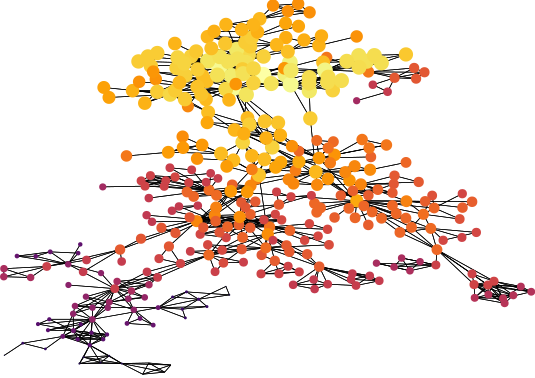

In [36]:
include("utils.jl")
using DiffusionTutorialUtilities
utils = DiffusionTutorialUtilities
A,xy = utils.load_graph_and_coords("newman-netsci")
include("diffusions.jl")
using DiffusionAlgorithms

P = utils.normout!(A)

function single_seed_stochastic_heat_kernel(P,t,seed)
    n = size(P,1)
    @assert 1 <= seed <= n
    
    M = -t*(eye(n)-P')
    v = zeros(size(P,1))
    v[seed] = 1.
    x = expm(M) * v
end
#x = single_seed_stochastic_heat_kernel([0. 1.; 1. 0], 5., 1)
#y = DiffusionAlgorithms.single_seed_stochastic_heat_kernel_series([0. 1.; 1. 0],5.,1)
x = single_seed_stochastic_heat_kernel(P,5.,1)
y = DiffusionAlgorithms.single_seed_stochastic_heat_kernel_series(P',5.,1)
#@show sum(x), sum(y)
#@show [x[1:5] y[1:5] x[1:5]./y[1:5]]
    utils.cgraphplot(A,xy,0.1*log(1/(max(minimum(x),1.e-12))*x),log(x+1.e-12),
        utils._inferno_data)

Interact.Slider{Float64}([Reactive.Input{Float64}] 12.5,"t",12.5,0.5:0.5:25.0)

Interact.Slider{Int64}([Reactive.Input{Int64}] 190,"seed",190,1:379)

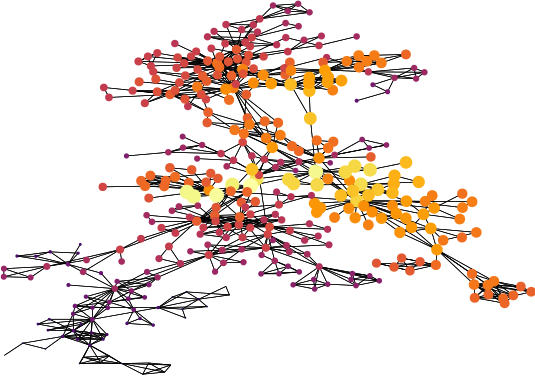

In [40]:
include("diffusions.jl")
using DiffusionAlgorithms
using Interact

A,xy = utils.load_graph_and_coords("newman-netsci");
P = utils.normout!(A)
n = size(A,1)
@manipulate for t=0.5:0.5:25, seed=1:n
    @time x = DiffusionAlgorithms.single_seed_stochastic_heat_kernel_series(P',t,seed)
    @show extrema(x), 1/n
    @show "here"
    utils.cgraphplot(A,xy,0.1*log(1/(max(minimum(x),1.e-12))*x),log(x+1.e-12),
        utils._inferno_data)
end   

Interact.Slider{Float64}([Reactive.Input{Float64}] 25.0,"t",25.0,0.5:0.5:50.0)

Interact.Slider{Int64}([Reactive.Input{Int64}] 1500,"seed",1500,1:3000)

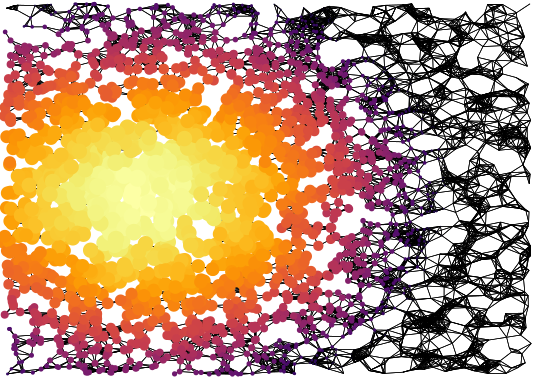

0.048880 seconds (45.80 k allocations: 2.849 MB)


In [41]:
include("diffusions.jl")
include("utils.jl")
using DiffusionAlgorithms
using DiffusionTutorialUtilities
utils = DiffusionTutorialUtilities

A,xy = utils.load_graph_and_coords("U3A")
P = utils.normout!(A)
n = size(A,1)

@manipulate for t=0.5:0.5:50, seed=1:n
    @time x = DiffusionAlgorithms.single_seed_stochastic_heat_kernel_series(P',t,seed)
    utils.cgraphplot(A,xy,0.1*log(1/(max(minimum(x),1.e-12))*x),log(x+1.e-12),
        utils._inferno_data)
end   

Interact.Slider{Float64}([Reactive.Input{Float64}] 25.0,"t",25.0,0.5:0.5:50.0)

Interact.Slider{Int64}([Reactive.Input{Int64}] 2288,"seed",2288,1:4575)

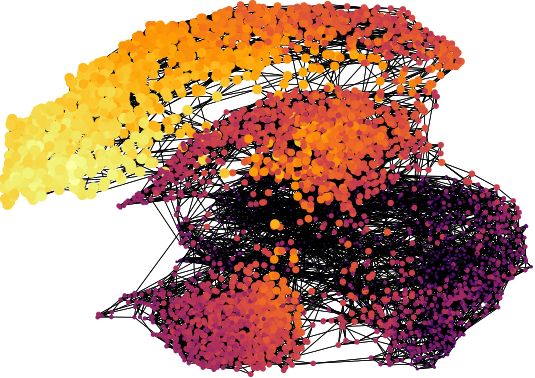

0.040906 seconds (45.80 k allocations: 2.924 MB)


In [43]:
include("diffusions.jl")
include("utils.jl")
using DiffusionAlgorithms
using DiffusionTutorialUtilities
utils = DiffusionTutorialUtilities

A,xy = utils.load_graph_and_coords("digits-1234-3")
A = utils.load_graph("digits-1234-5")
P = utils.normout!(A)
n = size(A,1)

@manipulate for t=0.5:0.5:50, seed=1:n
    @time x = DiffusionAlgorithms.single_seed_stochastic_heat_kernel_series(P',t,seed)
    utils.cgraphplot(A,xy,0.1*log(1/(max(minimum(x),1.e-12))*x),log(x+1.e-12),
        utils._inferno_data)
end   